### 周波数フィルタによるノイズ除去

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import warnings
warnings.simplefilter('ignore')
import IPython.display as ipd

In [20]:
sns.set_style('white')

In [21]:
DATA_DIR = 'data/'

### 換気扇の音が含まれる音声ファイル

In [22]:
data, sr = librosa.load(DATA_DIR+'noisy_voice.wav', sr=None)

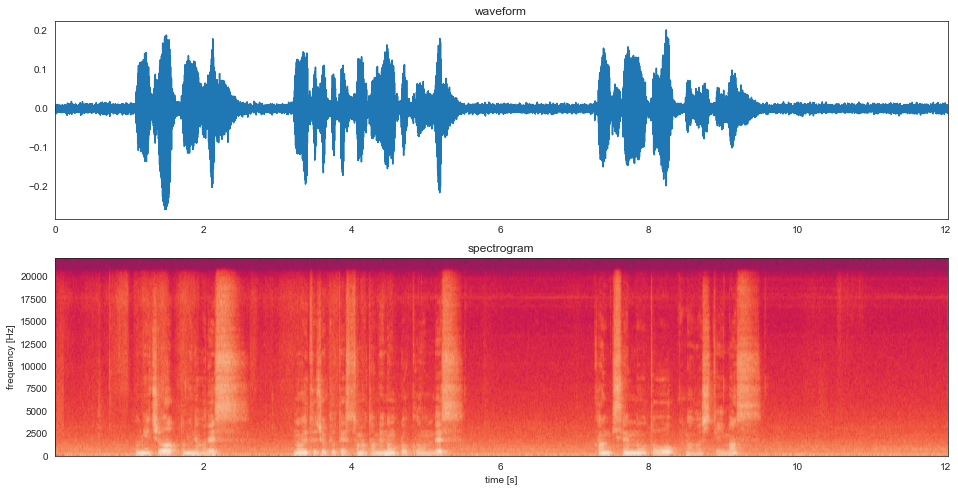

In [23]:
fig, axs = plt.subplots(2, 1, figsize=(16, 8))
axs = axs.ravel()
xs = np.arange(0, len(data)) / sr
axs[0].plot(xs, data)
axs[0].set_title('waveform')
axs[0].set_xlim(0, len(data)/sr)
axs[1].specgram(data, Fs=sr)
axs[1].set_title('spectrogram')
axs[1].set_xlabel('time [s]')
axs[1].set_ylabel('frequency [Hz]')
fig.show()

ipd.Audio(data, rate=sr)

In [68]:
def compare_plot(origin, denoise, sr=44100):
    xs = np.arange(0, len(origin)) / sr
    fig, axs = plt.subplots(4, 1, figsize=(16, 12))
    axs[0].plot(xs, origin)
    axs[0].set_title('original')
    axs[0].set_xlim(0, len(origin)/sr)
    axs[1].specgram(origin, Fs=sr)
    axs[1].set_title('spectrogram')
    axs[1].set_ylim(0, sr/2)
    axs[1].set_xlabel('time [s]')
    axs[1].set_ylabel('frequency [Hz]')
    axs[2].plot(xs, denoise)
    axs[2].set_title('denoise')
    axs[2].set_xlim(0, len(denoise)/sr)
    axs[3].specgram(denoise, Fs=sr)
    axs[3].set_title('denoise spectrogram')
    axs[3].set_ylim(0, sr/2)
    axs[3].set_xlabel('time [s]')
    axs[3].set_ylabel('frequency [Hz]')
    plt.tight_layout()
    fig.show()

    ipd.display('Before')
    ipd.display(ipd.Audio(origin, rate=sr))
    ipd.display('After')
    ipd.display(ipd.Audio(denoise, rate=sr))

---
### そもそもの今回のノイズ（換気扇）の周波数特製を確認する

音声が含まれない区間(10~12s)の区間でフーリエ変換する

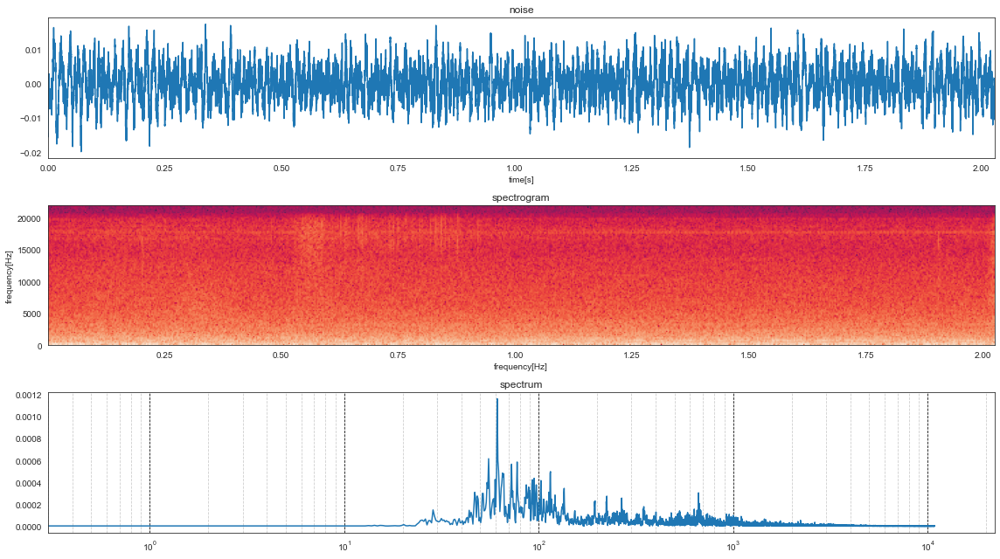

In [69]:
noise = data[int(sr*10.0):]

f_scale = np.linspace(0, sr, len(noise))[:int(sr/2)]
ham_win = np.hamming(len(noise))
f_noise = abs(np.fft.fft(noise*ham_win) / (len(noise)/2))[:int(sr/2)]

xs = np.arange(0, len(noise)) / sr
fig, axs = plt.subplots(3, 1, figsize=(16, 9))
axs[0].plot(xs, noise)
axs[0].set_title('noise')
axs[0].set_xlabel('time[s]')
axs[0].set_xlim(0, len(noise)/sr)
axs[1].specgram(noise, Fs=sr)
axs[1].set_title('spectrogram')
axs[1].set_xlabel('time[s]')
axs[1].set_ylabel('frequency[Hz]')
axs[1].set_ylim(0, sr/2)
axs[2].set_title('spectrum')
axs[1].set_xlabel('frequency[Hz]')
axs[2].set_xscale('log')
axs[2].plot(f_scale, f_noise)
axs[2].grid(which='major', axis='x', color='black', linestyle='--')
axs[2].grid(which='minor', axis='x', linestyle='--')
axs[2].set_xlim(0, int(sr/2))

plt.tight_layout()

#### 40~200Hzの帯域で, 特に60Hz付近で成分が多く含まれる様子

---
### 声帯の周波数以外をカットしてみる

声帯の主な周波数帯域を(100~1,000Hz)以外の帯域をカットしてみる

(-1500.0, 1500.0)

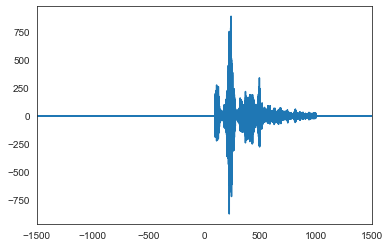

In [70]:
fft_data = np.fft.fft(data)
N = len(fft_data)
freq = np.fft.fftfreq(N, d=1/sr)

cut_i = np.where((freq < 100)|(freq > 1000))
fft_data[cut_i] =0 

cut_data = np.fft.ifft(fft_data)
plt.plot(freq, fft_data)
plt.xlim(-1500, 1500)

'Before'

'After'

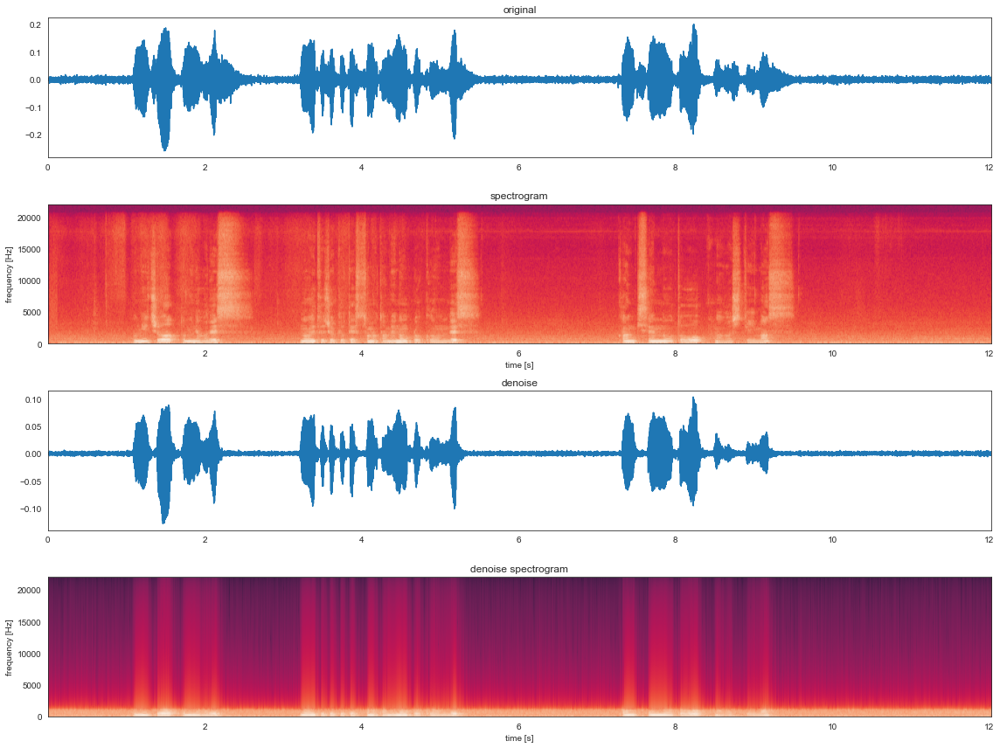

In [71]:
compare_plot(data, cut_data)

#### くぐもった音声になってしまったので中音域をもう少し取り入れる

'Before'

'After'

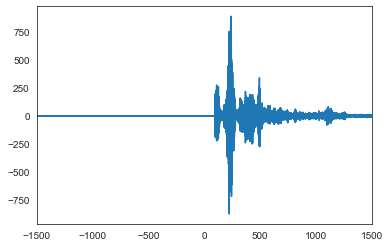

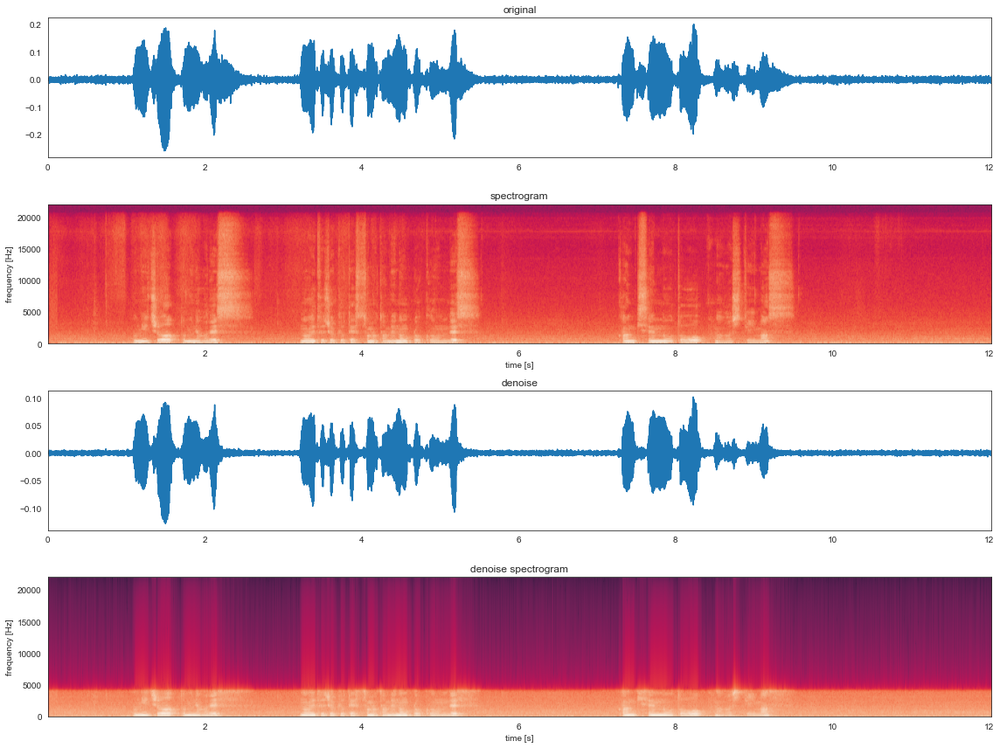

In [72]:
fft_data = np.fft.fft(data)
N = len(fft_data)
freq = np.fft.fftfreq(N, d=1/sr)

cut_i = np.where((freq < 100)|(freq > 4000))
fft_data[cut_i] =0 

cut_data = np.fft.ifft(fft_data)
plt.plot(freq, fft_data)
plt.xlim(-1500, 1500)

compare_plot(data, cut_data)

#### 低音をもう少しカットしてみる

'Before'

'After'

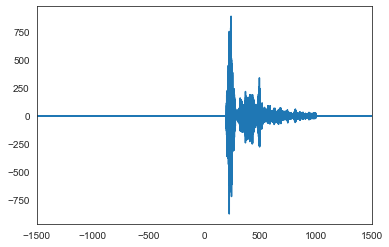

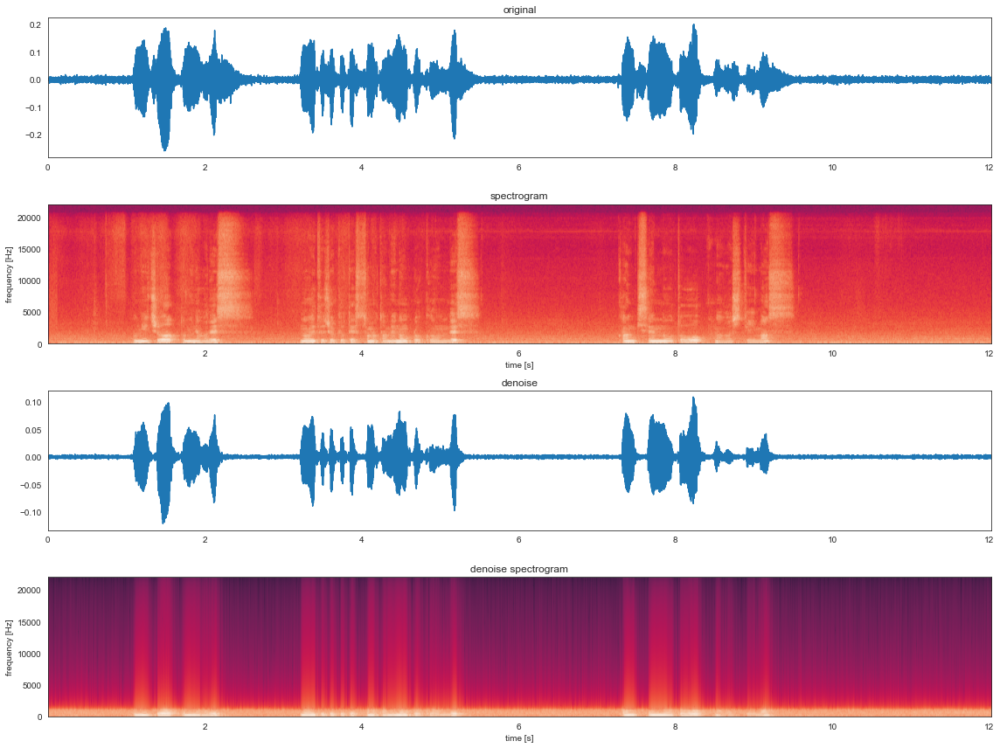

In [73]:
fft_data = np.fft.fft(data)
N = len(fft_data)
freq = np.fft.fftfreq(N, d=1/sr)

cut_i = np.where((freq < 200)|(freq > 1000))
fft_data[cut_i] =0 

cut_data = np.fft.ifft(fft_data)
plt.plot(freq, fft_data)
plt.xlim(-1500, 1500)

compare_plot(data, cut_data)

低域カット　&　中音域まで取り込む

'Before'

'After'

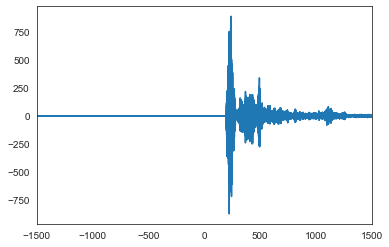

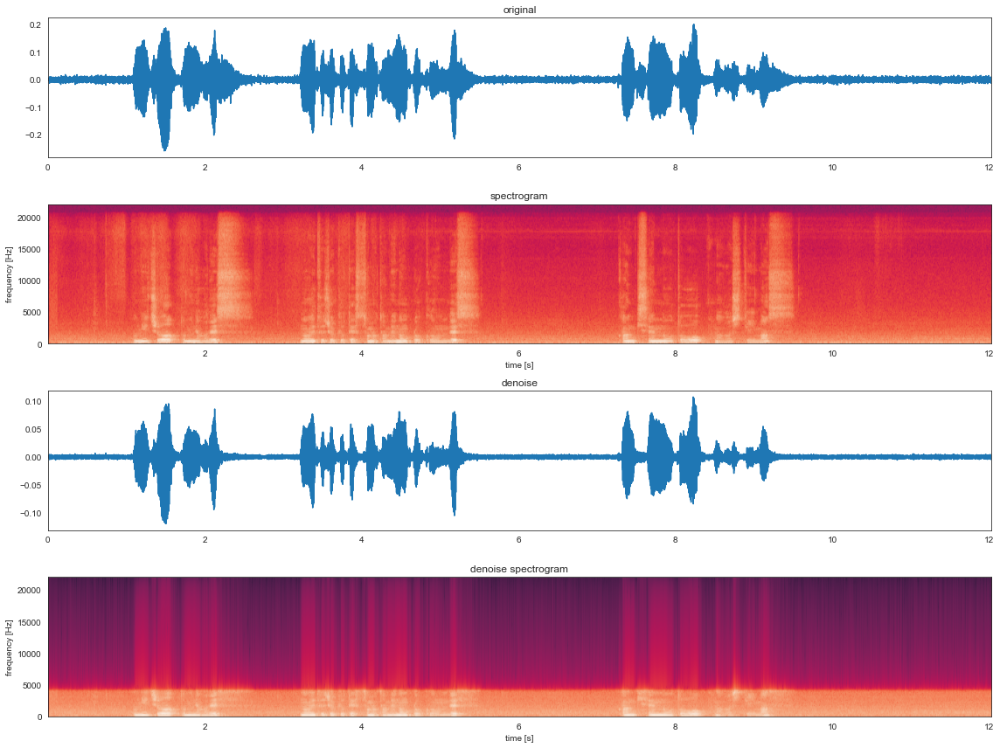

In [74]:
fft_data = np.fft.fft(data)
N = len(fft_data)
freq = np.fft.fftfreq(N, d=1/sr)

cut_i = np.where((freq < 200)|(freq > 4000))
fft_data[cut_i] =0 

cut_data = np.fft.ifft(fft_data)
plt.plot(freq, fft_data)
plt.xlim(-1500, 1500)

compare_plot(data, cut_data)